### This is to Study 3 min scalping strategy based on 1 min momentum .
###### Indicater will be used in this one is Super trend on 1 min .
###### Willt try to find Best Time in day to scalp and best Day to scalp to maximize the wining %

In [1]:
# import yfinance as yf
import pandas as pd
import numpy as np
from pymongo import MongoClient
import datetime
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from talib import abstract
import math
## This is to Convert a string representation of list into list 
import ast
from functools import partial

In [2]:
mydict={}
with open('nifty1min_28Jan_25Feb.txt', 'r') as file:
    data = file.read().rstrip()
    data=ast.literal_eval(data)

    
dfo=pd.DataFrame(data,columns =['Date','Open','High','Low','Close','Volume','NA'])
dfo['Date']=dfo['Date'].astype('datetime64[ns]')
dfo['Date']=dfo['Date'].dt.tz_localize("GMT").dt.tz_convert('Asia/Kolkata')
dfo.set_index('Date',inplace=True)

In [3]:
def pxline(to_plot):
    fig = px.line(to_plot)
    fig.show()

In [43]:
def mycandle(df):
    hols=["2021-01-26","2021-03-11","2021-03-26","2021-04-02","2021-04-14",
          "2021-04-21","2021-05-13","2021-07-21","2021-08-19","2021-09-10","2021-10-15",
          "2021-11-04","2021-11-05","2021-11-19","2022-01-26"]
    fig = go.Figure(data=[go.Scatter(x=df.index,y=df.Close)])
    fig.add_trace(go.Scatter(x=df.index,y=df['ST_10_2_h']))
    fig.update_xaxes(rangeslider_visible=False,
                     rangebreaks=[dict(bounds=["sat","mon"]),
                                  dict(bounds=[15.5,9.25],pattern='hour'),
                                  #dict(values=hols)
                                 ]
                    )
    fig.update_layout(title='IntraDay Analysis',yaxis_title='Nifty')
    fig.show()
        

In [37]:
df=dfo.copy()
df.drop('Volume',axis=1,inplace=True)
df.drop('NA',axis=1,inplace=True)

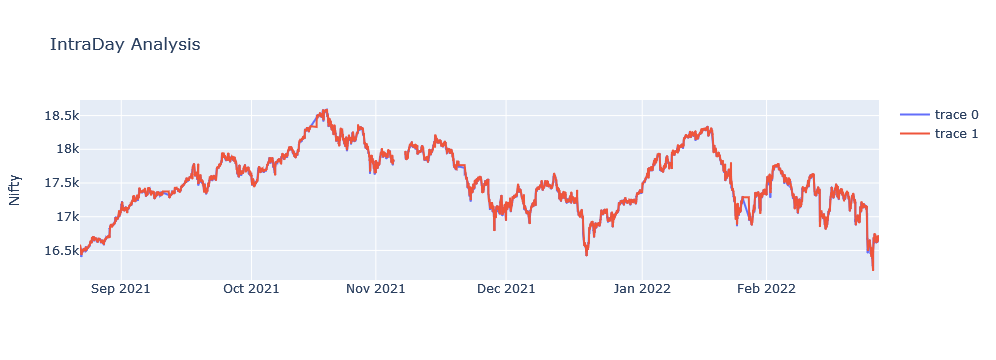

In [56]:
mycandle(df)

In [27]:
def EMA(df, base, target, period, alpha=False):
    con = pd.concat([df[:period][base].rolling(window=period).mean(), df[period:][base]])
    
    if (alpha == True):
        # (1 - alpha) * previous_val + alpha * current_val where alpha = 1 / period
        alpha= 1 / period
        df[target] = con.ewm(alpha, adjust=False).mean()
    else:
        # ((current_val - previous_val) * coeff) + previous_val where coeff = 2 / (period + 1)
        df[target] = con.ewm(span=period, adjust=False).mean()
    
    df[target].fillna(0, inplace=True)
    return df

In [30]:
def ATR(df, period, ohlc=['Open', 'High', 'Low', 'Close']):
    atr = 'ATR_' + str(period)

    # Compute true range only if it is not computed and stored earlier in the df
    if not 'TR' in df.columns:
        df['h-l'] = df[ohlc[1]] - df[ohlc[2]]
        df['h-yc'] = abs(df[ohlc[1]] - df[ohlc[3]].shift())
        df['l-yc'] = abs(df[ohlc[2]] - df[ohlc[3]].shift())
         
        df['TR'] = df[['h-l', 'h-yc', 'l-yc']].max(axis=1)
         
        df.drop(['h-l', 'h-yc', 'l-yc'], inplace=True, axis=1)

    # Compute EMA of true range using ATR formula after ignoring first row
    EMA(df, 'TR', atr, period, alpha=True)
    
    return df

In [36]:
def SuperTrend(df, period, multiplier,on='hl', ohlc=['Open', 'High', 'Low', 'Close']):
    ATR(df, period, ohlc=ohlc)
    atr = 'ATR_' + str(period)
    st = 'ST_' + str(period) + '_' + str(multiplier)+'_'+str(on)
    stx = 'STX_' + str(period) + '_' + str(multiplier)+'_'+str(on)
     # Compute basic upper and lower bands
    if on=='h':
        df['basic_ub'] = df[ohlc[1]] + (multiplier * df[atr])
        df['basic_lb'] = df[ohlc[1]] - (multiplier * df[atr])
    if on=='l':
        df['basic_ub'] = df[ohlc[2]] + (multiplier * df[atr])
        df['basic_lb'] = df[ohlc[2]] - (multiplier * df[atr])
    if on=='c':
        df['basic_ub'] = df[ohlc[3]] + (multiplier * df[atr])
        df['basic_lb'] = df[ohlc[3]] - (multiplier * df[atr])
    if on=='hl':
        hl2 = (df['high'] + df['low']) / 2
        df['basic_ub'] = hl2 + (multiplier * df[atr])
        df['basic_lb'] = hl2 - (multiplier * df[atr])

    # Compute final upper and lower bands
    df['final_ub'] = 0.00
    df['final_lb'] = 0.00
    for i in range(period, len(df)):
        df['final_ub'].iat[i] = df['basic_ub'].iat[i] if df['basic_ub'].iat[i] < df['final_ub'].iat[i - 1] or df[ohlc[3]].iat[i - 1] > df['final_ub'].iat[i - 1] else df['final_ub'].iat[i - 1]
        df['final_lb'].iat[i] = df['basic_lb'].iat[i] if df['basic_lb'].iat[i] > df['final_lb'].iat[i - 1] or df[ohlc[3]].iat[i - 1] < df['final_lb'].iat[i - 1] else df['final_lb'].iat[i - 1]
       
    # Set the Supertrend value
    df[st] = 0.00
    for i in range(period, len(df)):
        df[st].iat[i] = df['final_ub'].iat[i] if df[st].iat[i - 1] == df['final_ub'].iat[i - 1] and df[ohlc[3]].iat[i] <= df['final_ub'].iat[i] else \
                        df['final_lb'].iat[i] if df[st].iat[i - 1] == df['final_ub'].iat[i - 1] and df[ohlc[3]].iat[i] >  df['final_ub'].iat[i] else \
                        df['final_lb'].iat[i] if df[st].iat[i - 1] == df['final_lb'].iat[i - 1] and df[ohlc[3]].iat[i] >= df['final_lb'].iat[i] else \
                        df['final_ub'].iat[i] if df[st].iat[i - 1] == df['final_lb'].iat[i - 1] and df[ohlc[3]].iat[i] <  df['final_lb'].iat[i] else 0.00 
                 
    # Mark the trend direction up/down
    df[stx] = np.where((df[st] > 0.00), np.where((df[ohlc[3]] < df[st]), 'down',  'up'), np.NaN)

    # Remove basic and final bands from the columns
    df.drop(['basic_ub', 'basic_lb', 'final_ub', 'final_lb'], inplace=True, axis=1)
    
    df.fillna(0, inplace=True)

    return df


In [39]:
df=SuperTrend(df,10,2,'h')
df=SuperTrend(df,10,2,'l')


In [54]:
df.replace(to_replace=0,value=np.nan,inplace=True)
df.dropna(inplace=True)

In [55]:
df

,Open,High,Low,Close,TR,ATR_10,ST_10_2_h,STX_10_2_h,ST_10_2_l,STX_10_2_l
Date,,,,,,,,,,
2021-08-23 09:25:00+05:30,16550.25,16558.80,16544.95,16545.75,13.85,13.835909,16586.471818,down,16572.621818,down
2021-08-23 09:26:00+05:30,16545.10,16555.45,16544.85,16555.45,10.60,10.894174,16577.238347,down,16566.638347,down
2021-08-23 09:27:00+05:30,16555.40,16565.05,16555.40,16556.20,9.65,9.763107,16577.238347,down,16566.638347,down
2021-08-23 09:28:00+05:30,16556.75,16564.75,16554.40,16564.25,10.35,10.296646,16577.238347,down,16566.638347,down
2021-08-23 09:29:00+05:30,16564.15,16564.15,16549.80,16549.80,14.45,14.072422,16577.238347,down,16566.638347,down
...,...,...,...,...,...,...,...,...,...,...
2022-02-25 15:25:00+05:30,16649.90,16650.65,16645.30,16647.35,5.35,5.469797,16661.589595,down,16656.239595,down
2022-02-25 15:26:00+05:30,16647.20,16655.15,16647.20,16652.40,7.95,7.724527,16661.589595,down,16656.239595,down
2022-02-25 15:27:00+05:30,16652.70,16658.70,16651.80,16657.85,6.90,6.974957,16661.589595,down,16637.850086,up
